# Osnove digitalne obdelave slik

V tem "zvezku" boste izvedeli nekaj malega o digitalni obdelavi slik, hkrati pa se boste lahko z njim "igrali", saj je interaktiven. Bloke programske kode boste lahko po mili volji spreminjali in poganjali ter tako v živo preizkušali in dopolnjevali svoje znanje.

Tralala hopsasa

# Potrebščine
Programirali bomo v priljubljenem programskem jeziku po imenu python. *Programirali?* Da, računalniku bomo podajali navodila v natančnem in nedvoumnem jeziku. Tega jezika se ne bomo učili, saj bi za to potrebovali precej več časa, kot ga imamo na voljo. Programski jezik python nam bo služil le kot orodje, da spoznamo osnove digitalne obdelave slik.

Python sam po sebi ne ponuja funkcij za delo s slikami, k sreči pa takšne funkcije najdemo v posebnih dodatkih k jeziku, ki jim rečemo *knjižnice*. Potrebovali bomo sledeče knjižnice (besedilo, ki sledi znaku #, je komentar, ki je namenjen zgolj nam -- python ga namreč ignorira):

In [2]:
import numpy    # za delo z matrikami in drugimi matematičnimi zadevami
import cv2      # za delo s slikami
import matplotlib.pyplot as plt      # za prikazovanje slik, pa tudi risanje diagramov in še številnih drugih reči

# Kaj je slika?

Slika, kot jo razumemo računalnikarji (fotografi jo bržkone drugače, da ne omenjamo risarjev, slikarjev itd.), ni nič drugega kot matrika *pik*, ki jim rečemo tudi slikovni elementi ali (pogovorno) *piksli*. *Pika?* To je najmanjši "kvadratek", ki ga zaslon lahko prikaže. *Matrika?* Najbrž veste, da je to samo učeno ime za dvodimenzionalno tabelo (razpredelnico) števil.

Vsaka pika je povsem določena s svojo barvo. Tukaj pa se stvari že nekoliko zapletejo. Obstajajo namreč *sivinske* in *barvne* slike.

Pri sivinskih slikah je lahko vsaka pika obarvana z eno od 256 možnih sivin. Vsaka celica matrike je zatorej število med 0 in 255. Pika z vrednostjo 0 je črna kot noč, pika z vrednostjo 255 je bela kot sneg, vmes pa so pač različni odtenki sivin:

<img src="http://ltpo2.fri1.uni-lj.si/ultra/datoteke/sivine.svg" width=700>

Hej, ustavi konje! Zakaj od 0 do 255? Zakaj ne od 1 do 100? Ali pa, recimo, od 1 do 1000?  Kot čivkajo že ptički na vejah, smo računalnikarji čudaki, in ena od teh čudaškosti je, da pogosto štejemo od 0 naprej namesto od 1 naprej. (Za to dejansko imamo določene razloge, a presegajo okvir tega teksta.) Vse lepo in prav, ampak $\ldots$ zakaj gremo do 255? Zato, ker je to $256 - 1$ (od vključno 0 do vključno 255 je 256 možnih vrednosti), število 256 pa je v računalništvu, pa naj se sliši še tako prismojeno, bolj "okroglo" kot število 100 ali 1000, saj je $256 = 2^8$. Računalnik namreč vsa števila (in vse podatke nasploh) hrani in obdeluje v dvojiški obliki, torej kot zaporedje ničel in enic, in ne v desetiški obliki (kot zaporedje števk od 0 do 9), kot to počnemo ljudje.  Razlog za to je, da računalnik ne računa z desetimi prsti, pač pa z napetostmi, tokovi in naboji, pri teh količinah pa je veliko lažje ločevati med dvema različnima nivojema (npr. od 0 do 2 volta je "nizka" napetost, torej ničla, od 3 do 5 voltov pa "visoka" napetost, torej enica) kot pa med desetimi različnimi nivoji.

Da ne zabredemo v prehude podrobnosti, se spomnimo, da slika pove toliko kot tisoč (se opravičujem, 256) besed. V datoteki `majhna_sivinska.png` je shranjena *res* majhna slika (višine 5 in širine 11), a razlogom: na ta način bomo njeno zgradbo veliko lažje videli.

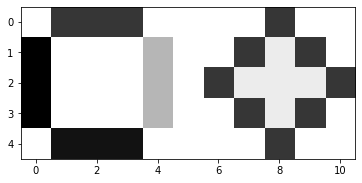

In [5]:
slika = cv2.imread('majhna_sivinska.png', cv2.IMREAD_GRAYSCALE)   # preberemo sliko iz datoteke; spremenljivka 'slika' sedaj vsebuje slikovno matriko
plt.imshow(slika, cmap='gray')    # sliko pokažemo

In [6]:
slika   # izpišimo slikovno matriko

array([[255,  54,  54,  54, 255, 255, 255, 255,  54, 255, 255],
       [  0, 255, 255, 255, 182, 255, 255,  54, 236,  54, 255],
       [  0, 255, 255, 255, 182, 255,  54, 236, 236, 236,  54],
       [  0, 255, 255, 255, 182, 255, 255,  54, 236,  54, 255],
       [255,  18,  18,  18, 255, 255, 255, 255,  54, 255, 255]],
      dtype=uint8)

Vidimo, da je matrika velika natanko toliko kot slika: $5 \times 11$. Ozadje je belo (255), notranjost kare na desni je svetlo, a ne povsem belo (236), njen rob je temen, a ne povsem črn (54) itd.

Zgornja leva pika ima koordinati (0, 0), nato pa koordinate $x$ naraščajo v desno, koordinate $y$ pa v desno. Desna soseda zgornje leve pike ima potemtakem koordinati (1, 0), spodnja pa (0, 1). Spodnja desna pika slike ima koordinati $(w - 1, h - 1)$, kjer je $w$ širina, $h$ pa višina slike. Do vrednosti pike na koordinatah $(x, y)$ dostopamo z zapisom `slika[y][x]`. Da, najprej navedemo koordinato $y$ in šele potem $x$, ker pri matriki najprej podamo številko vrstice (= $y$) in šele zatem številko stolpca (= $x$). Da čudaški računalnikarji štejemo od 0 naprej, pa smo že povedali.

Preverimo, ali je pika na koordinatah (4, 0) res bela, in jo spremenimo v "srednje sivo":

In [7]:
slika[0][4]

255

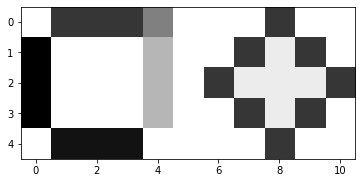

In [8]:
slika[0][4] = 128   # srednje siva
plt.imshow(slika, cmap='gray')

Sedaj bomo nekoliko potemnili notranjost "kvadrata" na levi:

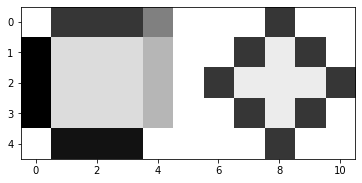

In [9]:
slika[1:4, 1:4] = 220   # vrstične koordinate (y) od 1 do 4, a brez 4; stolpčne koordinate (x) od 1 do 4, a brez 4
plt.imshow(slika, cmap='gray')

Tako kot lahko sliko preberemo iz datoteke, jo lahko tudi shranimo v datoteko. Sliko, s katero se ukvarjamo, bomo shranili v datoteko `majhna_sivinska_spremenjena.png`:

In [10]:
cv2.imwrite('majhna_sivinska_spremenjena.png', slika)

True

Preverimo, ali se je slika pravilno shranila. Odprimo jo in prikažimo:

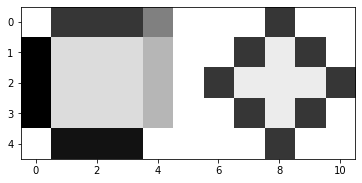

In [11]:
slika2 = cv2.imread('majhna_sivinska_spremenjena.png', cv2.IMREAD_GRAYSCALE)
plt.imshow(slika2, cmap='gray')

Kako pa je z barvnimi slikami? Na računalnikovem zaslonu so vse barve sestavljene kot kombinacija treh osnovnih barv: rdeče (R kot red), zelene (G kot green) in modre (B kot blue). Pri vsaki od teh treh barv imamo 256 možnih odtenkov, zato je vsaka pika barvne slike predstavljena s tremi števili z intervala od 0 do 255. Na primer, pika (255, 0, 0) je najsvetlejša možna "čista" rdeča, pika (255, 255, 0) je najsvetlejša rumena (= rdeča + zelena), pika (128, 0, 128) je temnejša vijoličasta itd.

Ali lahko -- glede na to, da je vsaka pika barvne slike predstavljena s tremi števili namesto z enim samim -- še vedno rečemo, da je barvna slika matrika (tj. dvodimenzionalna tabela)? Dejansko ne. Barvno sliko si lahko predstavljamo bodisi kot kvader velikosti $h \times w \times 3$ (kjer sta $h$ in $w$ višina slike) ali pa kot skupek treh matrik velikosti $h \times w$: ena matrika vsebuje vse rdeče komponente pik, druga zelene, tretja pa modre. Oglejmo si sliko v datoteki `majhna_barvna.png`:

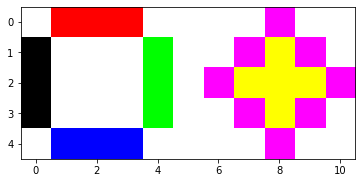

In [12]:
slika = cv2.imread('majhna_barvna.png', cv2.IMREAD_COLOR_RGB)   # spremenljivko 'slika' smo si "povozili" z novo sliko, seveda pa bi lahko sliko prebrali v spremenljivko z drugačnim imenom in bi ohranili oboje
plt.imshow(slika)

In [13]:
slika[0, 1, :]   # vse tri komponente pike na koordinatah (1, 0) (najsvetlejša rdeča)

array([255,   0,   0], dtype=uint8)

In [14]:
slika[2, 6, :]   # vse tri komponente pike na koordinatah (6, 2) (najsvetlejša vijoličasta)

array([255,   0, 255], dtype=uint8)

In [15]:
slika[:, :, 0]    # matrika rdečih komponent posameznih pik

array([[255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255],
       [  0, 255, 255, 255,   0, 255, 255, 255, 255, 255, 255],
       [  0, 255, 255, 255,   0, 255, 255, 255, 255, 255, 255],
       [  0, 255, 255, 255,   0, 255, 255, 255, 255, 255, 255],
       [255,   0,   0,   0, 255, 255, 255, 255, 255, 255, 255]],
      dtype=uint8)

In [16]:
slika[:, :, 1]   # matrika zelenih komponent posameznih pik

array([[255,   0,   0,   0, 255, 255, 255, 255,   0, 255, 255],
       [  0, 255, 255, 255, 255, 255, 255,   0, 255,   0, 255],
       [  0, 255, 255, 255, 255, 255,   0, 255, 255, 255,   0],
       [  0, 255, 255, 255, 255, 255, 255,   0, 255,   0, 255],
       [255,   0,   0,   0, 255, 255, 255, 255,   0, 255, 255]],
      dtype=uint8)

In [17]:
slika[:, :, 2]   # matrika modrih komponent posameznih pik

array([[255,   0,   0,   0, 255, 255, 255, 255, 255, 255, 255],
       [  0, 255, 255, 255,   0, 255, 255, 255,   0, 255, 255],
       [  0, 255, 255, 255,   0, 255, 255,   0,   0,   0, 255],
       [  0, 255, 255, 255,   0, 255, 255, 255,   0, 255, 255],
       [255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255]],
      dtype=uint8)

Kot vidimo, so pri belih pikah (teh je največ) vse tri komponente na maksimumu (255). Pri rumenih pikah, denimo, sta rdeča in zelena komponenta enaki 255, modra pa 0.

Spremenimo notranjost "kvadrata" na levi v barvo sivke ($R = 150$, $G = 120$, $B = 182$):

In [18]:
slika[1:4, 1:4, 0] = 150
slika[1:4, 1:4, 1] = 120
slika[1:4, 1:4, 2] = 182

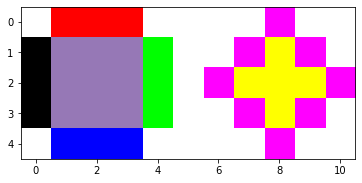

In [19]:
plt.imshow(slika)

Sedaj pa celotno modro matriko nastavimo na 0:

In [20]:
slika[:, :, 2] = 0

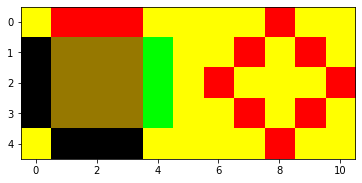

In [21]:
plt.imshow(slika)

Jasno: če beli (255, 255, 255) odvzamemo modro, nam ostane rumena (255, 255, 0), na rdečo in zeleno pa odvzem modre ne vpliva.

# Barvne pretvorbe

Barvno sliko zlahka pretvorimo v sivinsko:

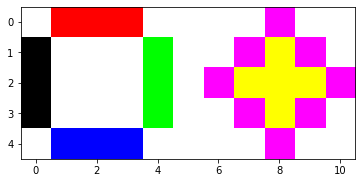

In [22]:
barvna = cv2.imread('majhna_barvna.png', cv2.IMREAD_COLOR_RGB)
plt.imshow(barvna)

In [23]:
barvna    # dobili bomo "kvader" velikosti 5 x 11 x 3

array([[[255, 255, 255],
        [255,   0,   0],
        [255,   0,   0],
        [255,   0,   0],
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        [255,   0, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[  0,   0,   0],
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        [  0, 255,   0],
        [255, 255, 255],
        [255, 255, 255],
        [255,   0, 255],
        [255, 255,   0],
        [255,   0, 255],
        [255, 255, 255]],

       [[  0,   0,   0],
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        [  0, 255,   0],
        [255, 255, 255],
        [255,   0, 255],
        [255, 255,   0],
        [255, 255,   0],
        [255, 255,   0],
        [255,   0, 255]],

       [[  0,   0,   0],
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        [  0, 255,   0],
        [255, 255, 255],
        [255, 255, 

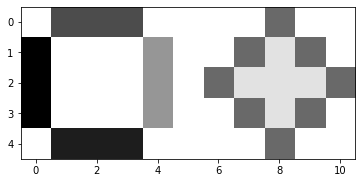

In [24]:
sivinska = cv2.cvtColor(barvna, cv2.COLOR_RGB2GRAY)
plt.imshow(sivinska, cmap='gray')

In [25]:
sivinska  # dobili bomo matriko velikosti 5 x 11, ki pa ne bo povsem enaka matriki slike majhna_sivinska.png

array([[255,  76,  76,  76, 255, 255, 255, 255, 105, 255, 255],
       [  0, 255, 255, 255, 150, 255, 255, 105, 226, 105, 255],
       [  0, 255, 255, 255, 150, 255, 105, 226, 226, 226, 105],
       [  0, 255, 255, 255, 150, 255, 255, 105, 226, 105, 255],
       [255,  29,  29,  29, 255, 255, 255, 255, 105, 255, 255]],
      dtype=uint8)

Seveda lahko tudi sivinsko sliko pretvorimo v barvno. Nastala slika bo na videz enaka, bo pa namesto z eno matriko predstavljena s tremi.

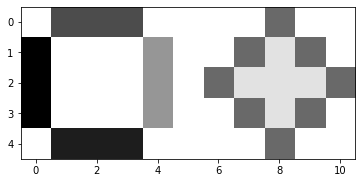

In [26]:
barvna_iz_sivinske = cv2.cvtColor(sivinska, cv2.COLOR_GRAY2RGB)
plt.imshow(barvna_iz_sivinske)

Kot že vemo, ima vsaka pika sivinske slike eno samo komponento (celotna slika je torej matrika), vsaka pika barvne slike pa ima tri komponente (celotna slika je "kvader"), čeprav so pri vseh pikah vse tri komponente enake.

In [27]:
sivinska[0, 1]

76

In [28]:
barvna_iz_sivinske[0, 1]

array([76, 76, 76], dtype=uint8)

# Geometrijske transformacije

Geometrijske transformacije delujejo nad točkami v koordinatnem sistemu. Na primer, sledeča transformacija zavrti vsako točko pravokotnika za 30 stopinj (v obratni smeri urinega kazalca) okrog koordinatnega izhodišča:

<img src="http://ltpo2.fri1.uni-lj.si/ultra/datoteke/rotacija.svg" width=1000>

Kako točke pravokotnika na levi strani preslikamo v točke pravokotnika na desni strani? Z množenjem matrik! Matrika rotacije za kot $\phi$ okrog koordinatnega izhodišča izgleda takole:
$$
\left[
\begin{array}{cc}
\cos(\phi) & -\sin(\phi)\\
\sin(\phi) & \cos(\phi)
\end{array}
\right]
$$

Koordinate točke $A'$ sedaj izračunamo tako, da gornjo matriko pomnožimo s koordinatami točke $A$:
$$
\left[
\begin{array}{cc}
\cos(\pi/6) & -\sin(\pi/6)\\
\sin(\pi/6) & \cos(\pi/6)
\end{array}
\right]
\left[
\begin{array}{cc}
-1\\
-2\\
\end{array}
\right]
\approx
\left[
\begin{array}{cc}
0.134\\
-2.232\\
\end{array}
\right]
$$

Na enak način dobimo tudi koordinate točk $B'$, $C'$ in $D'$ in seveda tudi koordinate vseh vmesnih točk na daljicah. Mimogrede, saj vemo, da je $30^{\circ} = \pi/6$, kajne?

Zavrtimo še sliko okrog njene središčne točke. Pri sliki je, kot smo že povedali koordinatni sistem nekoliko drugačen kot v matematiki: zgornja leva točka ima koordinati (0, 0), spodnja desna pa $(w-1, h-1)$, kjer sta $w$ in $h$ sta širina in višina slike. Sredinska točka ima potemtakem koordinati $(w/2, h/2)$.

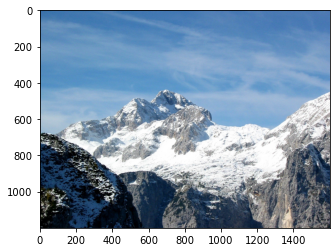

In [30]:
slika = cv2.imread('triglav.jpg', cv2.IMREAD_COLOR_RGB)
plt.imshow(slika)

In [31]:
visina, sirina, _ = slika.shape   # dolžina tretje dimenzije nas ne zanima, sicer pa vemo, da je enaka 3 (spomnimo se: barvna slika je "kvader" velikosti h x w x 3)
visina

1200

In [32]:
sirina

1600

In [33]:
# izračunamo transformacijsko matriko (za vrtenje za kot 30 stopinj)
matrika = cv2.getRotationMatrix2D((sirina / 2, visina / 2), 30, 1)  # os rotacije podamo kot (x, y) = (stolpec, vrstica), tretji parameter pa je faktor povečanja oz. zmanjšanja
matrika

array([[   0.8660254 ,    0.5       , -192.82032303],
       [  -0.5       ,    0.8660254 ,  480.38475773]])

V matriki lahko vidimo tako $\cos(\pi/6)$ = $\sqrt{3}/2 \approx 0.866$ kot $\sin(\pi/6) = 1/2$, tretji stolpec pa predstavlja premik (os rotacije ni točka (0, 0), ampak točka (800, 600)).

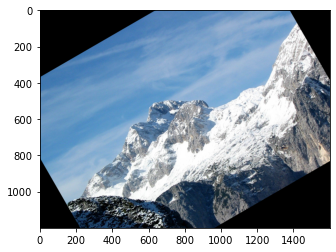

In [34]:
zavrtena_slika = cv2.warpAffine(slika, matrika, (sirina, visina))
plt.imshow(zavrtena_slika)

Nekatere geometrijske transformacije sliko samo zavrtijo ali spremenijo njeno velikost, obstajajo pa tudi takšne, ki jo popačijo, še vedno pa daljice preslikajo v daljice. Če bi takšno transformacijo uporabili na pravokotniku, bi dobili paralelogram, trapez ali še splošnejši štirikotnik. Če želimo uporabiti tovrstno transformacijo, si izberemo štiri točke na sliki in povemo, kam naj se preslikajo, potem pa s pomočjo funkcije izračunamo transformacijsko matriko.

Oglejmo si primer. Sledeča fotografija je slikana pod "čudnim" kotom:

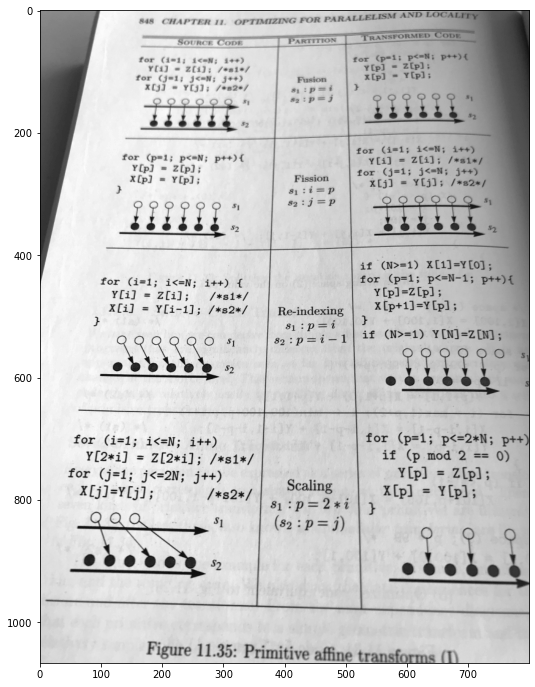

In [35]:
cudna = cv2.imread('tekst.png', cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(12, 12))
plt.imshow(cudna, cmap='gray')

Poskusimo jo poravnati. Točko na zgornjem levem robu teksta bi radi premaknili v zgornji levi kot slike, točko na zgornjem desnem robu teksta bi želeli premakniti v zgornji desni rob slike itd. Opisano preslikavo si lahko predstavljamo takole:

<img src="http://ltpo2.fri1.uni-lj.si/ultra/datoteke/perspektiva.svg" width=1100>

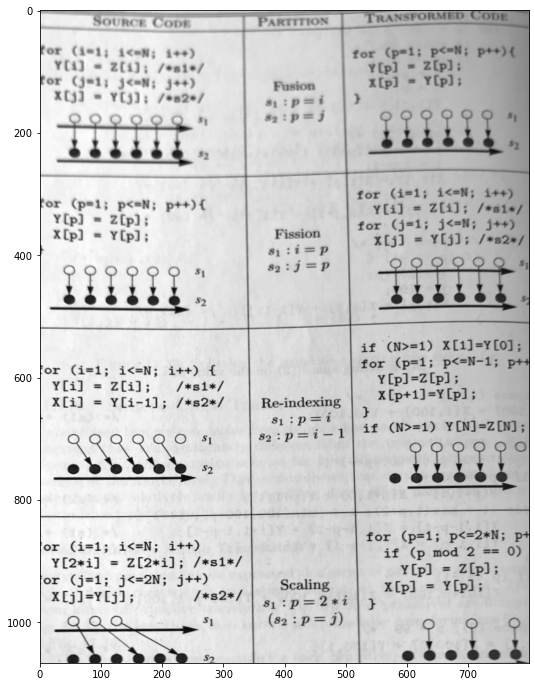

In [37]:
visina, sirina = cudna.shape     # višina in širina izvorne slike
matrika = cv2.getPerspectiveTransform(
    numpy.array([[169, 43], [711, 35], [799, 934], [30, 902]], dtype=numpy.float32),    # seznam točk na izvorni sliki (vsaka je podana kot par (x, y))
    numpy.array([[0, 0], [sirina - 1, 0], [sirina - 1, visina - 1], [0, visina - 1]], dtype=numpy.float32)   # pripadajoče točke na ciljni sliki
)

poravnana = cv2.warpPerspective(cudna, matrika, (sirina, visina))
plt.figure(figsize=(12, 12))
plt.imshow(poravnana, cmap='gray')

Kot vidimo, so na transformirani sliki navpične črte veliko "bolj" navpične kot na originalni.

# Filtriranje

Operacija filtriranja vključuje sliko in majhno kvadratno matriko (pogosto $3 \times 3$ ali $5 \times 5$), ki ji rečemo *jedro*. Rezultat filtriranja je slika, v kateri vrednost pike na koordinatah $(x, y)$ pridobimo tako, da središče jedra položimo na piko $(x, y)$ v izvorni sliki, nato pa v kvadratu, ki ga pokriva jedro, zmnožimo vsako piko slike z istoležno piko jedra in vse skupaj seštejemo. Na primer, sledeča matrika je t.i. *Gaussovo jedro* velikosti 3:

In [38]:
jedro = numpy.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]]) / 16
jedro

array([[0.0625, 0.125 , 0.0625],
       [0.125 , 0.25  , 0.125 ],
       [0.0625, 0.125 , 0.0625]])

Filtrirajmo sliko v datoteki `majhna_sivinska.png`':

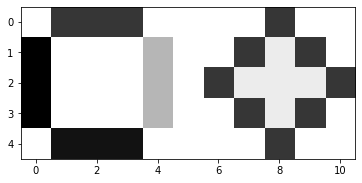

In [39]:
slika = cv2.imread('majhna_sivinska.png', cv2.IMREAD_GRAYSCALE)
plt.imshow(slika, cmap='gray')

In [40]:
slika

array([[255,  54,  54,  54, 255, 255, 255, 255,  54, 255, 255],
       [  0, 255, 255, 255, 182, 255, 255,  54, 236,  54, 255],
       [  0, 255, 255, 255, 182, 255,  54, 236, 236, 236,  54],
       [  0, 255, 255, 255, 182, 255, 255,  54, 236,  54, 255],
       [255,  18,  18,  18, 255, 255, 255, 255,  54, 255, 255]],
      dtype=uint8)

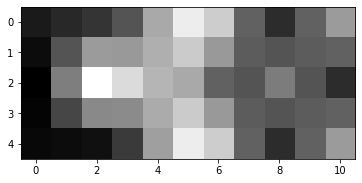

In [41]:
filtrirana_slika = cv2.filter2D(slika, -1, jedro)
plt.imshow(filtrirana_slika, cmap='gray')

In [42]:
filtrirana_slika

array([[141, 148, 154, 170, 212, 246, 230, 177, 150, 177, 205],
       [134, 170, 205, 204, 215, 229, 204, 174, 170, 174, 177],
       [128, 191, 255, 237, 218, 212, 177, 170, 190, 170, 150],
       [130, 163, 196, 197, 213, 229, 204, 174, 170, 174, 177],
       [132, 134, 136, 157, 207, 246, 230, 177, 150, 177, 205]],
      dtype=uint8)

Kako smo, recimo, dobili vrednost 212 na koordinatah (5, 2) (`slika[2, 5]`, torej tretja vrstica in šesti stolpec)? Tako, da smo središče jedra položili na piko (5, 2) v originalni sliki, zmnožili istoležne vrednosti pik originalne slike in elementov jedra ter vse skupaj sešteli:

In [43]:
slika[1:4, 4:7]  # koordinate x od 4 do vključno 6, koordinate y od 1 do vključno 3; središče je točka (5, 2)

array([[182, 255, 255],
       [182, 255,  54],
       [182, 255, 255]], dtype=uint8)

In [44]:
jedro 

array([[0.0625, 0.125 , 0.0625],
       [0.125 , 0.25  , 0.125 ],
       [0.0625, 0.125 , 0.0625]])

In [45]:
182 * 0.0625 + 255 * 0.125 + 255 * 0.0625 + 182 * 0.125 + 255 * 0.25 + 54 * 0.125 + 182 * 0.0625 + 255 * 0.125 + 255 * 0.0625

211.625

Vrednosti pik so lahko samo cela števila, zato se rezultat zaokroži na 212.

Naša slika je premajhna, da bi lahko videli, v čem je smisel filtriranja. Poskusimo z večjo sliko:

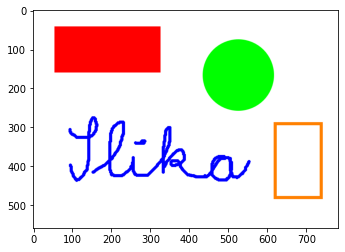

In [46]:
slika = cv2.imread('narisana.png', cv2.IMREAD_COLOR_RGB)
plt.imshow(slika)

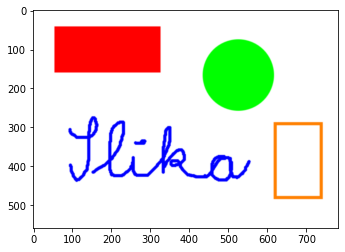

In [47]:
filtrirana_slika = cv2.filter2D(slika, -1, jedro)
plt.imshow(filtrirana_slika)

Oglejmo si zgornji levi kot rdečega pravokotnika:

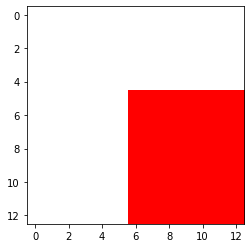

In [48]:
plt.imshow(slika[37:50, 49:62, :])

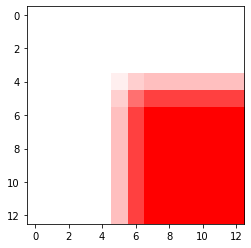

In [49]:
plt.imshow(filtrirana_slika[37:50, 49:62, :])

Vidimo, da so prehodi mehkejši. Na originalni sliki iz bele preidemo neposredno na rdečo, na filtrirani pa je ta prehod postopen.

Če vzamemo večje jedro (npr. velikosti $15 \times 15$), je učinek *mehčanja* precej bolj očiten:

In [50]:
vektor15 = cv2.getGaussianKernel(15, -1)
vektor15

array([[0.00410725],
       [0.01074341],
       [0.02423753],
       [0.04716174],
       [0.07914918],
       [0.11456666],
       [0.14302942],
       [0.15400959],
       [0.14302942],
       [0.11456666],
       [0.07914918],
       [0.04716174],
       [0.02423753],
       [0.01074341],
       [0.00410725]])

In [51]:
jedro15 = vektor15 @ numpy.transpose(vektor15)  # Gaussovo jedro je matrični produkt gornjega vektorja z njegovo transponirano različico (stolpec * vrstica = matrika)
jedro15

array([[1.68695298e-05, 4.41259253e-05, 9.95496935e-05, 1.93705202e-04,
        3.25085721e-04, 4.70554313e-04, 5.87458075e-04, 6.32556395e-04,
        5.87458075e-04, 4.70554313e-04, 3.25085721e-04, 1.93705202e-04,
        9.95496935e-05, 4.41259253e-05, 1.68695298e-05],
       [4.41259253e-05, 1.15420958e-04, 2.60393881e-04, 5.06678098e-04,
        8.50332429e-04, 1.23083718e-03, 1.53662440e-03, 1.65458887e-03,
        1.53662440e-03, 1.23083718e-03, 8.50332429e-04, 5.06678098e-04,
        2.60393881e-04, 1.15420958e-04, 4.41259253e-05],
       [9.95496935e-05, 2.60393881e-04, 5.87458075e-04, 1.14308423e-03,
        1.91838091e-03, 2.77681348e-03, 3.46668058e-03, 3.73281271e-03,
        3.46668058e-03, 2.77681348e-03, 1.91838091e-03, 1.14308423e-03,
        5.87458075e-04, 2.60393881e-04, 9.95496935e-05],
       [1.93705202e-04, 5.06678098e-04, 1.14308423e-03, 2.22422947e-03,
        3.73281271e-03, 5.40316295e-03, 6.74551611e-03, 7.26335978e-03,
        6.74551611e-03, 5.40316295e-0

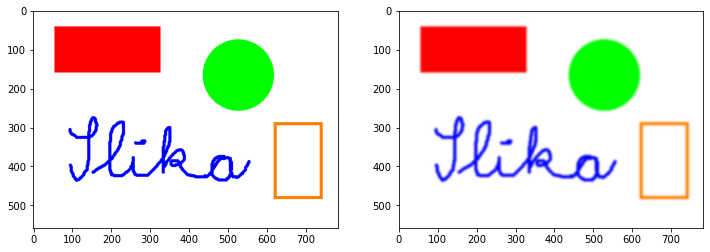

In [52]:
filtrirana_slika15 = cv2.filter2D(slika, -1, jedro15)
plt.figure(figsize=(12, 12))
plt.subplot(1, 2, 1)   # originalno in filtrirano sliko bomo postavili eno poleg druge
plt.imshow(slika)
plt.subplot(1, 2, 2)
plt.imshow(filtrirana_slika15)

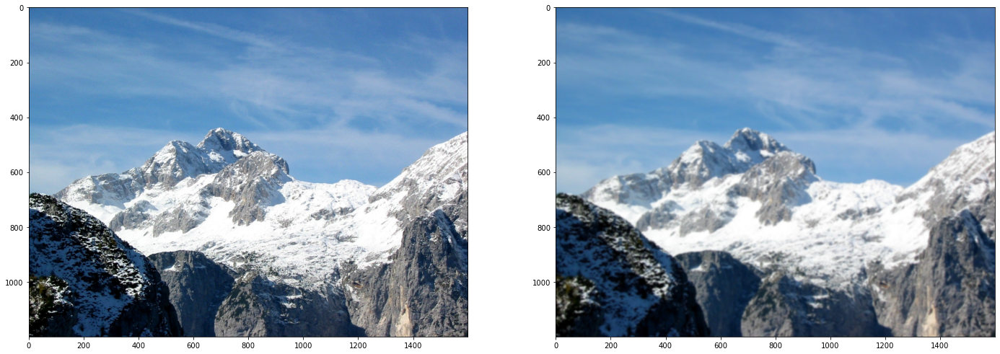

In [53]:
triglav = cv2.imread('triglav.jpg', cv2.IMREAD_COLOR_RGB)
filtrirani_triglav = cv2.filter2D(triglav, -1, jedro15)
plt.figure(figsize=(24, 24))
plt.subplot(1, 2, 1)
plt.imshow(triglav)
plt.subplot(1, 2, 2)
plt.imshow(filtrirani_triglav)

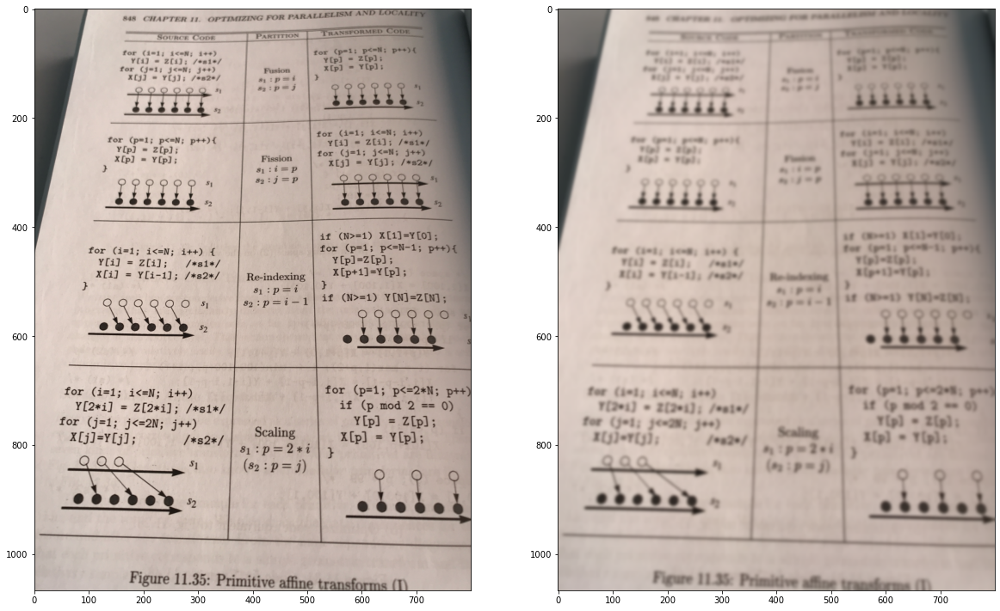

In [54]:
tekst = cv2.imread('tekst.png')
filtrirani_tekst = cv2.filter2D(tekst, -1, jedro15)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(tekst)
plt.subplot(1, 2, 2)
plt.imshow(filtrirani_tekst)

Zanimivo je, da lahko s pomočjo jedra sliko tudi *izostrimo*. Primer ostrilnega jedra je matrika

$$
\left[
\begin{array}{rrr}
0 & -1 & 0\\
-1 & 5 & -1\\
0 & -1 & 0\\
\end{array}
\right]
$$

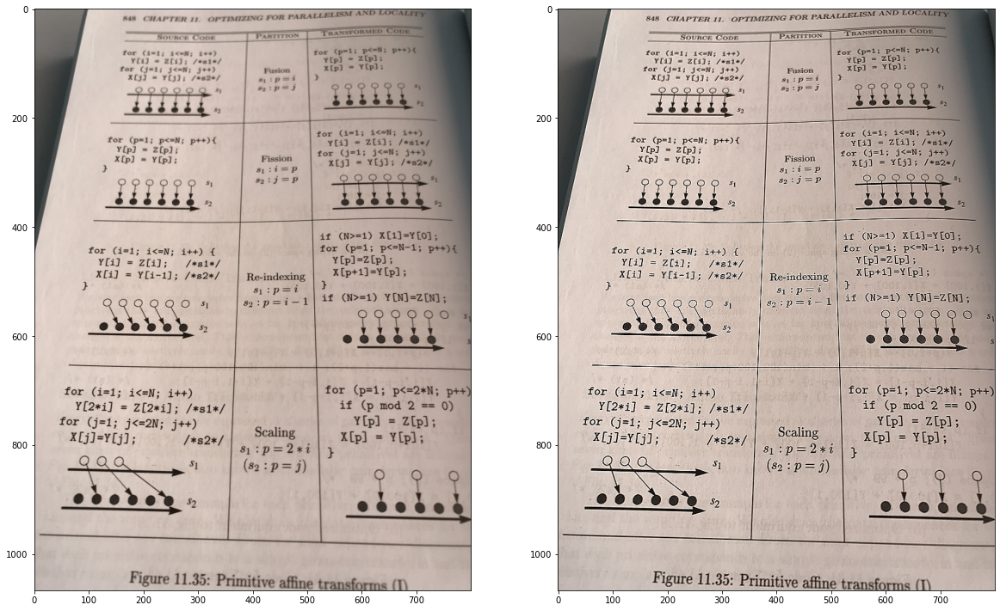

In [55]:
jedro = numpy.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
izostreni_tekst = cv2.filter2D(tekst, -1, jedro)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(tekst)
plt.subplot(1, 2, 2)
plt.imshow(izostreni_tekst)

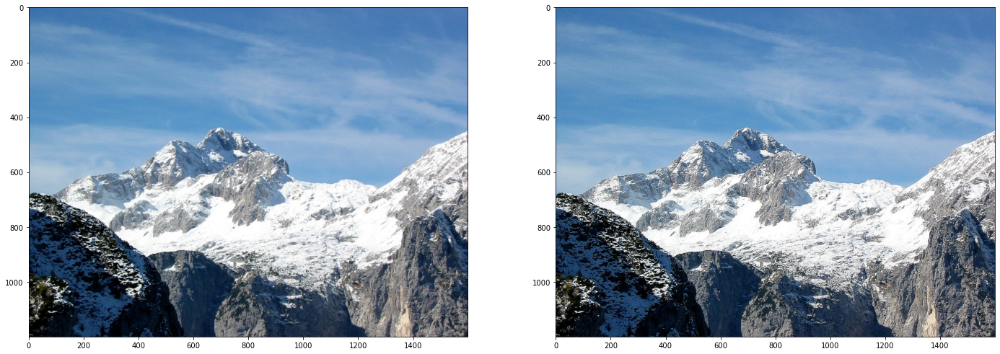

In [56]:
triglav = cv2.imread('triglav.jpg', cv2.IMREAD_COLOR_RGB)
izostreni_triglav = cv2.filter2D(triglav, -1, jedro)
plt.figure(figsize=(24, 24))
plt.subplot(1, 2, 1)
plt.imshow(triglav)
plt.subplot(1, 2, 2)
plt.imshow(izostreni_triglav)

Da bomo učinek lažje videli, bomo pod drobnogled vzeli košček slike, kjer se vrh dotika neba:

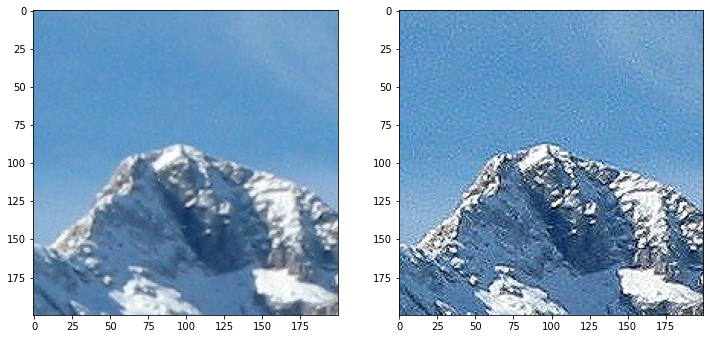

In [57]:
plt.figure(figsize=(12, 12))
plt.subplot(1, 2, 1)
plt.imshow(triglav[350:550, 600:800])
plt.subplot(1, 2, 2)
plt.imshow(izostreni_triglav[350:550, 600:800])

S filtriranjem lahko izluščimo *robove* (prehode med barvami):

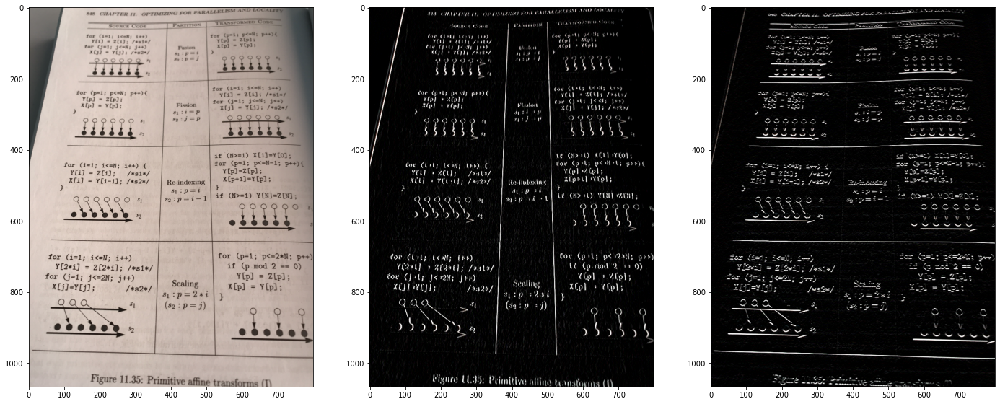

In [58]:
slika = cv2.imread('tekst.png')
sobel_navpicno = numpy.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])  # jedro za poudarjanje navpičnih robov
sobel_vodoravno = numpy.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])  # jedro za poudarjanje vodoravnih robov
slika1 = cv2.filter2D(slika, -1, sobel_navpicno)
slika2 = cv2.filter2D(slika, -1, sobel_vodoravno)
plt.figure(figsize=(24, 24))
plt.subplot(1, 3, 1)
plt.imshow(slika)
plt.subplot(1, 3, 2)
plt.imshow(slika1)
plt.subplot(1, 3, 3)
plt.imshow(slika2)

S prvim jedrom smo poudarili navpične, z drugim pa vodoravne robove. Iskanje robov je pogosto prva faza pri zahtevnejših problemih računalniškega vida, kot je npr. prepoznavanje objektov, segmentacija ipd. Ker je iskanje robov tako pogosta operacija, nam knjižnica OpenCV za ta namen ponuja funkcijo:

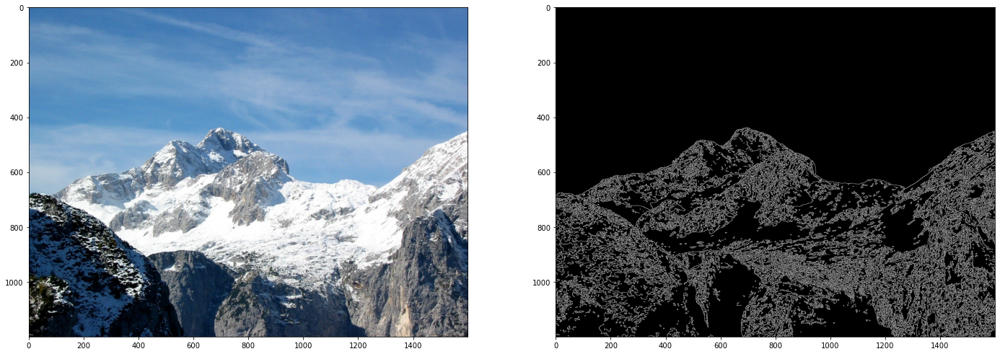

In [59]:
slika = cv2.imread('triglav.jpg', cv2.IMREAD_COLOR_RGB)
robovi = cv2.Canny(slika, 100, 200)  # z drugim in tretjim parametrom lahko določamo, kateri prehodi se bodo šteli kot rob in kateri ne
plt.figure(figsize=(24, 24))
plt.subplot(1, 2, 1)
plt.imshow(slika)
plt.subplot(1, 2, 2)
plt.imshow(robovi, cmap='gray')

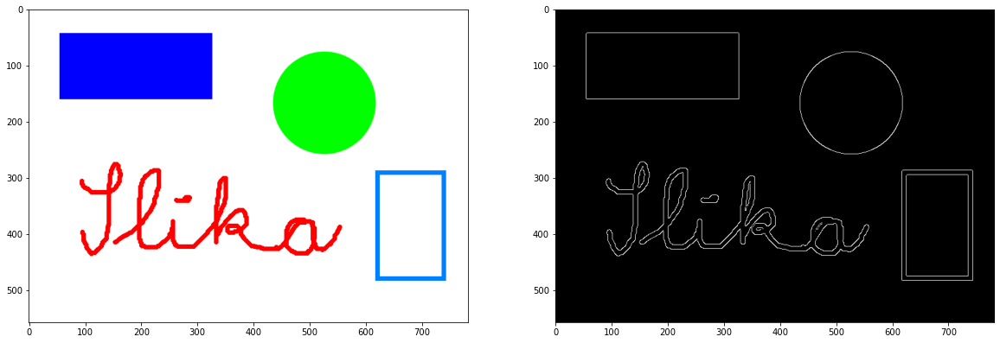

In [60]:
slika = cv2.imread('narisana.png')
robovi = cv2.Canny(slika, 100, 200)
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(slika)
plt.subplot(1, 2, 2)
plt.imshow(robovi, cmap='gray')

# Morfološke operacije

Morfološke operacije so podobne filtriranju, le da namesto množenja in seštevanja računamo minimume in maksimume, jedro pa je matrika, ki vsebuje le enice in ničle.

Najenostavnejši morfološki operaciji sta *erozija* (tanjšanje) in *dilatacija* (debeljenje). Pri obeh operacijah na vsako piko slike položimo jedro (to storimo na enak način kot pri filtriranju, torej tako, da sredina jedra sovpade s trenutno obravnavano piko), nato pa vrednost istoležne pike v transformirani sliki izračunamo kot minimum (pri eroziji) oziroma maksimum (pri dilataciji) vrednosti vseh pik, ki jih pokrivajo enice jedra.

Oglejmo si primer. Recimo, da je naše jedro matrika
$$
\left[
\begin{array}{rrr}
0 & 1 & 0\\
1 & 1 & 1\\
0 & 1 & 0\\
\end{array}
\right]
$$
slika pa je matrika
$$
\left[
\begin{array}{rrrrr}
1 & 2 & 3 & 4 & 5\\
6 & 7 & 8 & 9 & 10\\
11 & 12 & 13 & 14 & 15\\
16 & 17 & 18 & 19 & 20\\
\end{array}
\right]
$$
Izračunajmo transformirano vrednost pike na koordinatah (1, 2) (tretja vrstica, drugi stolpec). Sredinsko celico jedra položimo na omenjeno piko (v naši izvorni sliki ima ta vrednost 12). Enice jedra sedaj pokrivajo pike z vrednostmi 7, 11, 12, 13 in 17. Minimum teh vrednosti je 7, maksimum pa 17, zato bo v transformirani sliki pika na koordinatah (1, 2) imela vrednost 7 pri eroziji oziroma 17 pri dilataciji.

In [61]:
jedro = numpy.array([[0, 1, 0], [1, 1, 1], [0, 1, 0]], dtype=numpy.uint8)
slika = numpy.array([[1, 2, 3, 4, 5], [6, 7, 8, 9, 10], [11, 12, 13, 14, 15], [16, 17, 18, 19, 20]], dtype=numpy.uint8)
slika

array([[ 1,  2,  3,  4,  5],
       [ 6,  7,  8,  9, 10],
       [11, 12, 13, 14, 15],
       [16, 17, 18, 19, 20]], dtype=uint8)

In [62]:
cv2.erode(slika, jedro)

array([[ 1,  1,  2,  3,  4],
       [ 1,  2,  3,  4,  5],
       [ 6,  7,  8,  9, 10],
       [11, 12, 13, 14, 15]], dtype=uint8)

In [63]:
cv2.dilate(slika, jedro)

array([[ 6,  7,  8,  9, 10],
       [11, 12, 13, 14, 15],
       [16, 17, 18, 19, 20],
       [17, 18, 19, 20, 20]], dtype=uint8)

Erozija "tanjša" svetla in "razširja" temna območja slike, dilatacija pa "razširja" svetla in "tanjša" temna območja. Zakaj? Zaradi enostavnosti predpostavimo, da delamo s črno-belo sliko (vsaka pika ima bodisi vrednost 0 bodisi vrednost 255) in da je jedro matrika
$$
\left[
\begin{array}{rrr}
1 & 1 & 1\\
1 & 1 & 1\\
1 & 1 & 1
\end{array}
\right]
$$
Pri uporabi takšnega jedra na sliki bomo torej za vsako piko izračunali minimum (pri eroziji) oziroma maksimum (pri dilataciji) vrednosti te pike in še vseh njenih osmih sosed. Če je torej vsaj ena soseda trenutne pike črna, bo trenutna pika pri eroziji postala črna ne glede na njeno trenutno vrednost, saj je min(0, 255) = 0. Pri dilataciji pa velja tole: če je vsaj ena soseda trenutne pike bela, bo trenutna pika postala bela ne glede na njeno trenutno vrednost.

Kak primer se bo gotovo prilegel:

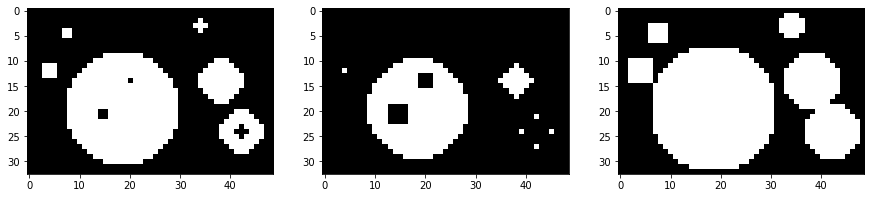

In [64]:
slika = cv2.imread('crnobela.png', cv2.IMREAD_GRAYSCALE)  # slika je v resnici sivinska, vendar pa je vsaka pika bodisi 0 bodisi 255
jedro = numpy.ones((3, 3), dtype=numpy.uint8)  # [[1, 1, 1], [1, 1, 1], [1, 1, 1]]
slika_erozija = cv2.erode(slika, jedro)
slika_dilatacija = cv2.dilate(slika, jedro)

plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(slika, cmap='gray')
plt.subplot(1, 3, 2)
plt.imshow(slika_erozija, cmap='gray')
plt.subplot(1, 3, 3)
plt.imshow(slika_dilatacija, cmap='gray')

Podobna logika velja tudi pri splošnejših sivinskih in barvnih slikah. Erozija odebeljuje temna območja na račun svetlih, dilatacija pa odebeljuje svetla območja na račun temnih.

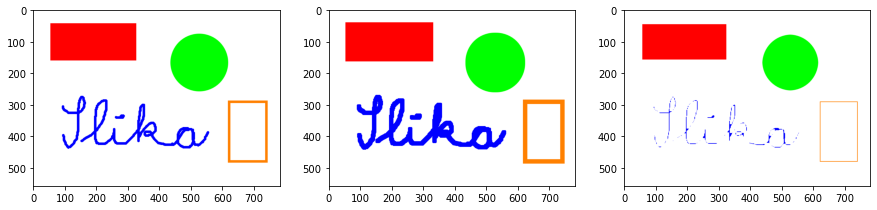

In [65]:
slika = cv2.imread('narisana.png', cv2.IMREAD_COLOR_RGB)
jedro = numpy.ones((7, 7), dtype=numpy.uint8)    # matrika 7 x 7 s samimi enicami
slika_erozija = cv2.erode(slika, jedro)
slika_dilatacija = cv2.dilate(slika, jedro)

plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(slika, cmap='gray')
plt.subplot(1, 3, 2)
plt.imshow(slika_erozija, cmap='gray')
plt.subplot(1, 3, 3)
plt.imshow(slika_dilatacija, cmap='gray')

Koristni morfološki operaciji sta tudi *odprtje* in *zaprtje*. Odprtje je zaporedje erozije in dilatacije, zaprtje pa je zaporedje dilatacije in erozije, pri čemer pri obeh podoperacijah uporabimo isto jedro. Pri slikah s temnim ozadjem odprtje pobriše majhne svetle "packe", zaprtje pa zapolni majhne luknje. Pri slikah s svetlim ozadjem je ravno obratno.

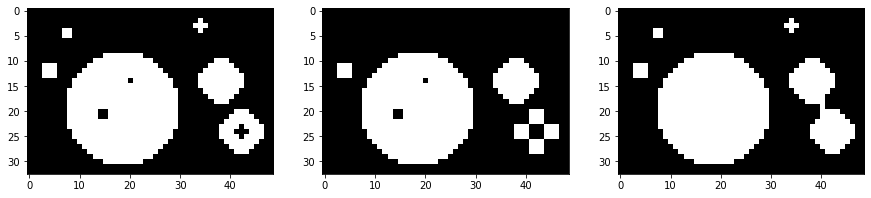

In [66]:
slika = cv2.imread('crnobela.png', cv2.IMREAD_GRAYSCALE)
jedro = numpy.ones((3, 3), dtype=numpy.uint8)  # [[1, 1, 1], [1, 1, 1], [1, 1, 1]]
slika_odprtje = cv2.morphologyEx(slika, cv2.MORPH_OPEN, jedro)
slika_zaprtje = cv2.morphologyEx(slika, cv2.MORPH_CLOSE, jedro)

plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(slika, cmap='gray')
plt.subplot(1, 3, 2)
plt.imshow(slika_odprtje, cmap='gray')
plt.subplot(1, 3, 3)
plt.imshow(slika_zaprtje, cmap='gray')

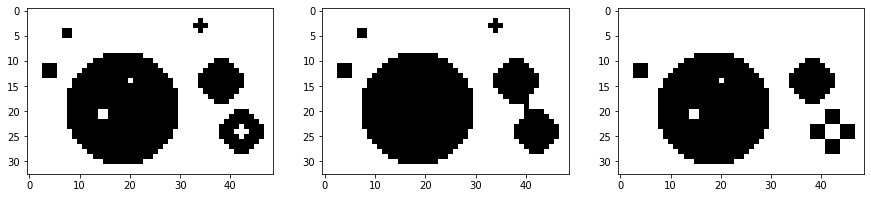

In [67]:
slikai = 255 - slika   # "inverzija" slike (pika z vrednostjo 0 se spremeni v piko z vrednostjo 255 in obratno)
slikai_odprtje = cv2.morphologyEx(slikai, cv2.MORPH_OPEN, jedro)  # uporabimo isto jedro kot v prejšnjem primeru
slikai_zaprtje = cv2.morphologyEx(slikai, cv2.MORPH_CLOSE, jedro)

plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(slikai, cmap='gray')
plt.subplot(1, 3, 2)
plt.imshow(slikai_odprtje, cmap='gray')
plt.subplot(1, 3, 3)
plt.imshow(slikai_zaprtje, cmap='gray')

# Učenje in prepoznavanje objektov

Spoznali smo nekaj najosnovnejših tehnik digitalne obdelave slik. Prepoznavanje objektov, bodisi v smislu *klasifikacije* (kateri objekt je na sliki?) bodisi v smislu *detekcije* (kje na sliki se nahaja določen objekt?), je v splošnem *bistveno* zahtevnejši problem. Če želimo na slikah iskati, denimo, avtomobile, se moramo najprej na množici slik avtomobilov naučiti *modela* avtomobila. Tega se lahko lotimo na različne načine. Lahko, recimo, izluščimo robove (kjer so robovi, se nekaj "dogaja"), nato pa poskušamo ugotoviti, v kakšnih razmerjih so med seboj. Lahko robove združujemo v večje "dele" (npr. kolesa, blatnike, okna), iz teh "delov" pa nato sestavimo model celotnega objekta. Danes so priljubljene *nevronske mreže*, ki postopek učenja v veliki meri avtomatizirajo.

Ko se na tak ali drugačen način naučimo modela objekta, ga lahko uporabimo za klasifikacijo ali detekcijo objektov na realnih slikah. Če vemo, kako naj bi izgledal avto, lahko na sliki izluščimo robove in ugotovimo, ali oziroma kje so robovi postavljeni v razmerjih, kot jih zahteva model avtomobila. Lahko preverimo, ali lahko robove združimo v "dele", ki pripadajo avtomobilu, in ali so "deli" sestavljeni na ustrezen način. Danes si tudi pri klasifikaciji in detekciji pogosto pomagamo z nevronskimi mrežami.

V tem razdelku si bomo ogledali klasičen problem prepoznavanja objektov, ki ga je mogoče razmeroma dobro rešiti že z enostavnimi pristopi. Gre za klasifikacijo slik na roko napisanih števk, ki jih hrani podatkovna zbirka <a href="https://www.kaggle.com/datasets/hojjatk/mnist-dataset">MNIST</a>. Tako učne slike (tiste, na katerih se učimo modelov posameznih števk) kot testne slike (tiste, pri katerih ugotavljamo, katero števko prikazujejo) so majhne ($28 \times 28$) in enostavne, saj je na obeh prikazana zgolj bela števka na črnem ozadju. (Realni problemi prepoznavanja so znatno težji, saj so objekti na testnih slikah tipično prikazani na realnem ozadju, lahko so različno veliki, fotografirani pod različnimi koti, zavrteni, delno zakriti, zamegljeni ipd.)

Pokažimo nekaj učnih in testnih slik iz zbirke MNIST:

<img src="http://ltpo2.fri1.uni-lj.si/ultra/datoteke/mnist.png">

Podatkovna zbirka MNIST vsebuje kar $60\,000$ učnih in $10\,000$ testnih slik. Vse učne slike so zaradi varčnosti shranjene v eni sami datoteki. Enako velja za testne slike. Poleg datotek z učnimi in testnimi slikami sta v zbirki še datoteki, ki vsebujeta oznake pripadajočih slik (torej števke, ki jih posamezne slike predstavljajo). Na primer, prvi izmed zgornjih slik pripada oznaka 5, drugi oznaka 0, tretji oznaka 4 itd.

Oglejmo si program, ki se na podlagi učnih slik nauči modelov posameznih števk, nato pa naučene modele preveri na testnih slikah.

In [76]:
import urllib.request  # za branje datoteke s spleta

STRANICA = 28
VELIKOST = STRANICA * STRANICA

ST_UCENJE = 1000         # če to spremenimo na 60000 (toliko je vseh učnih slik), bo klasifikacijska točnost boljša, bo pa dlje trajalo ...
ST_TESTIRANJE = 1000     # to lahko spremenimo na 10000 (toliko je vseh testnih slik), seveda pa bo postopek trajal dlje

BAZNI_URL = 'http://ltpo2.fri1.uni-lj.si/ultra/datoteke/'

def sprozi():
    # iz podatkovne zbirke izlušči učne in testne slike ter pripadajoče oznake
    slike_ucenje = pripravi_slike('mnist-ucne-slike.bin', ST_UCENJE)
    oznake_ucenje = pripravi_oznake('mnist-ucne-oznake.bin', ST_UCENJE)
    slike_testiranje = pripravi_slike('mnist-testne-slike.bin', ST_TESTIRANJE)
    oznake_testiranje = pripravi_oznake('mnist-testne-oznake.bin', ST_TESTIRANJE)

    # iz učnih slik se nauči modelov posameznih števk
    knn = cv2.ml.KNearest_create()
    knn.train(slike_ucenje, cv2.ml.ROW_SAMPLE, oznake_ucenje)

    # naučene modele preizkusi na testnih slikah
    rezultati = knn.findNearest(slike_testiranje, k=3)[1]
    rezultati = numpy.array([round(t[0]) for t in rezultati])

    # izračunaj klasifikacijsko točnost (delež pravilno klasificiranih slik)
    tocnost = 100 * numpy.sum(oznake_testiranje == rezultati) / ST_TESTIRANJE
    print(tocnost)

    # to dvoje bomo potrebovali še kasneje
    return oznake_testiranje, rezultati

#
# Vrne tabelo vektorjev dolžine 28 * 28 = 784, ki hranijo posamezne slike iz učne ali testne zbirke.
# Slike bi sicer predstavili kot matrike velikosti 28 x 28, vendar pa izbrani metodi učenja in klasifikacije
# zahtevata predstavitev slik z vektorji. Vektor slike izdelamo preprosto tako, da vrstice slike zapišemo eno za drugo.
#
def pripravi_slike(datoteka, stSlik):
    # V datoteki so slike shranjene zaporedno. Vsaka slika zavzema VELIKOST = 28 * 28 = 784 bajtov
    # (1 bajt = 8 bitov, torej 8 dvojiških števk, kar je dovolj za predstavitev števil od 0 do 255, torej vrednosti ene slikovne pike).

    f = urllib.request.urlopen(BAZNI_URL + datoteka)   # odpremo datoteko s slikami    
    bajti = f.read()[16:]      # prvih 16 bajtov datoteke preskočimo, saj vsebujejo le (za nas nepomembno) glavo
    rezultat = []              # slike bomo (kot vektorje) shranili v tabelo
    for i in range(stSlik):    # sprehodimo se po vseh slikah
        tabela = list(map(int, bajti[VELIKOST * i : VELIKOST * (i + 1)]))   # i-ta slika sega od bajta na položaju 784 * i do bajta na položaju 784 * (i + 1)
        rezultat.append(tabela)   # vektor slike dodamo v tabelo
    f.close()                  # zapremo datoteko
    return numpy.array(rezultat, dtype=numpy.float32)

def pripravi_oznake(datoteka, stSlik):
    f = urllib.request.urlopen(BAZNI_URL + datoteka)
    bajti = f.read()[8:]    # prvih 8 bajtov datoteke preskočimo, nato vsak bajt hrani eno oznako (i-ti bajt je oznaka i-te slike)
    rezultat = []
    for i in range(stSlik):
        razred = bajti[i]
        rezultat.append(razred)
    f.close()
    return numpy.array(rezultat, dtype=int)

pravilne_oznake, dobljene_oznake = sprozi()     # poženemo celoten postopek

81.4


Klasifikacijska točnost 81,4% morda ni najboljša, vendar pa smo za učenje uporabili zgolj 1000 slik od 60000. Če bi vrednost spremenljivke `ST_UCENJE` nastavili na 60000, vrednost spremenljivke `ST_TESTIRANJE` pa na 10000, bi dobili točnost 97,05%, vendar pa bi celoten postopek trajal bistveno dlje (okrog pol minute, lahko pa tudi več).

Uporabili smo enostavno metodo *$k$ najbližjih sosedov*, ki za vsako testno sliko poišče $k$ učnih slik, ki so ji najbolj podobne. Med $k$ najbolj podobnimi učnimi slikami izberemo najbolj zastopano oznako. Recimo, če je $k = 3$ (tako kot v našem primeru), med $k$ učnimi slikami, ki so podani testni sliki najbolj podobne, pa je ena slika devetice in dve sliki štirice, bo metoda podano sliko proglasila za sliko štirice. Kot smo videli, metoda $k$ najbližjih sosedov pri prepoznavanju števk doseže dokaj dober rezultat, treba pa je upoštevati, da sta učni in testni scenarij karseda poenostavljena. V realnih učnih scenarijih bi morali uporabiti katero od močnejših učnih in klasifikacijskih metod.

Za konec si oglejmo, katere števke najpogosteje pomešamo:

In [77]:
mesanje = {}
for i in range(ST_TESTIRANJE):
    p = pravilne_oznake[i]
    d = dobljene_oznake[i]
    if p != d:
        mesanje[(p, d)] = mesanje.get((p, d), 0) + 1
zamesani_pari = list(mesanje.keys())
zamesani_pari.sort(key=lambda par: -mesanje[par])
for par in zamesani_pari:
    print(f'{par} -> {mesanje[par]}')

(4, 9) -> 26
(2, 1) -> 12
(2, 7) -> 9
(3, 5) -> 9
(9, 7) -> 7
(8, 3) -> 7
(8, 9) -> 7
(3, 2) -> 6
(7, 1) -> 6
(6, 0) -> 5
(8, 5) -> 5
(8, 0) -> 5
(9, 4) -> 5
(2, 8) -> 5
(5, 4) -> 4
(5, 3) -> 4
(3, 1) -> 4
(5, 1) -> 4
(2, 0) -> 4
(8, 2) -> 4
(8, 1) -> 4
(5, 6) -> 4
(3, 8) -> 4
(3, 9) -> 3
(8, 7) -> 3
(0, 6) -> 3
(5, 9) -> 3
(7, 9) -> 2
(4, 1) -> 2
(4, 6) -> 2
(2, 6) -> 2
(7, 4) -> 2
(6, 5) -> 1
(2, 3) -> 1
(9, 1) -> 1
(6, 4) -> 1
(5, 0) -> 1
(3, 7) -> 1
(9, 3) -> 1
(3, 6) -> 1
(2, 5) -> 1
(7, 5) -> 1
(7, 2) -> 1
(4, 7) -> 1
(2, 4) -> 1
(8, 6) -> 1


Kot vidimo, največkrat štirico proglasimo za devetico. To ni presenetljivo, saj sta si števki pri nekaterih piscih lahko dokaj podobni. No, če za učenje uporabimo vseh 60000 slik, za testiranje pa vseh 10000, na vrh seznama pripleza par (7, 1) (sedmico proglasimo za enico), na drugem in tretjem mestu pa pristaneta para (4, 9) in (8, 3). Preverite sami!